# **Filtering Images**

Filtering is a fundamental concept in image processing, particularly in computer vision and machine learning applications. By modifying images through filters, we can enhance certain features, suppress noise, or highlight specific characteristics that might not be immediately apparent in the raw image data.

From a machine learning perspective, incorporating filtering into the preprocessing pipeline can indeed significantly impact model performance. Different filters can extract different sets of features, which may be more informative for the task at hand. Therefore, deciding whether to apply filters and selecting the appropriate ones become crucial steps in the data preprocessing phase, and should be part of a ML pipeline.

Now we are going to show the results of applying some kind of filters on images.

To work with the different filtering method we have to transform images in pixels matrices, this can be considered as a filter extraction method, and will be covered in more detailed in upcoming sections.

## **Requirements**

Here we gather the required libraries, classes and function for this notebook.

In [24]:
import polars as pl
import numpy as np
from PIL import Image
import os
import sys
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
from skimage import exposure

`PyImageML` is a Python package that has been developed under this project, which has several utils for plotting images and extracting features from them, features that later could be used along with Machine Learning algorithms to solve typical ML tasks.


In [25]:
sys.path.insert(0, r"C:\Users\fscielzo\Documents\Packages\PyImageML_Package_Private")
from PyImageML.preprocessing import equalize_color_image_HSV, get_V_component, apply_filter


## **Reading the data**

In [26]:
# Extracting the names of the images files as well as their class/category.
files_list_name = r'C:\Users\fscielzo\Documents\DataScience-GitHub\Image Analysis\Image-Classification\Fire-Detection\files_list.txt'
files_df = pl.read_csv(files_list_name, separator='\t', has_header=False, new_columns=['path', 'class'])
img_files_names = [files_df['path'][i].split('/')[1] for i in range(len(files_df))]

# building a list with the current paths of the data-set images.
img_path_list = []
folder_path = r'C:\Users\fscielzo\Documents\DataScience-GitHub\Image Analysis\Image-Classification\Fire-Detection\Data'
for filename in img_files_names:
    img_path_list.append(os.path.join(folder_path, filename))

## **Defining Response and Predictors**

In this section we define the response and predictors.

- **Predictors:** a list with the paths of the images files.
- **Response:** a vector (1D array) that identify the category of each image.


In [27]:
Y = files_df['class'].to_numpy()
X = img_path_list 

## **Equalization**

Equalization is one such filtering technique. It aims to enhance the contrast of an image by redistributing the intensity values, typically stretching out the intensity range to cover the entire spectrum. This can make details more distinguishable, especially in images with poor contrast or lighting conditions.

We distinguish different procedures for equalizing images depending on whether they are gray-scale or color.

Histogram equalization is a technique used in image processing to improve the contrast of an image by redistributing the intensity values of the pixels. It's based on the concept of histogram, which is a graphical representation of the distribution of pixel intensities in an image.

Here's how histogram equalization works:

- **Compute Histogram:** The first step is to compute the histogram of the input grayscale image. The histogram shows the frequency of occurrence of each intensity value in the image.

- **Compute Cumulative Distribution Function (CDF):** Next, the cumulative distribution function (CDF) is calculated based on the histogram. The CDF represents the cumulative sum of normalized frequencies in the histogram. It essentially shows the cumulative probability of occurrence of each intensity value.

- **Normalize the CDF:** The CDF values are then normalized to map them to the range [0, 1]. This ensures that the intensity values of the output image will also be in the range [0, 1].

- **Map Intensity Values:** Each pixel in the input image is then mapped to a new intensity value based on the normalized CDF. This mapping redistributes the intensity values such that the CDF of the output image approaches a straight line, which corresponds to a uniform distribution of intensities.

- **Create Equalized Image:** Finally, the new intensity values obtained from the mapping are assigned to the corresponding pixels in the output image, creating the equalized image

### **Equalization of gray-scale images**

In this section we are going to analyze how to equalize gray-scale images.

The following function summarize the process followed to equalize an image.

In [28]:
def get_equalization(img_array):

    img_vector = img_array.flatten()
    n_pixels = len(np.unique(img_vector))

    # Step 1: Compute Histogram
    counts, pixels = np.histogram(img_vector, bins=n_pixels, range=(0,n_pixels))
  
    # Step 2: Compute Cumulative Distribution Function (CDF)
    cdf = counts.cumsum()
 
    # Step 3: Normalize the CDF
    cdf_norm = cdf / float(cdf.max())
    pixels_cdf_norm = {int(pixels[i]): cdf_norm[i] for i in range(len(cdf_norm))}
    
    # Step 4: Map Intensity Values
    img_equalized_vector = []
    for x in img_vector:
        img_equalized_vector.append(pixels_cdf_norm[x])
    img_equalized_vector = np.array(img_equalized_vector)
    # Equivalent to: equalized_image = np.interp(img_vector, pixels[:-1], cdf_norm)
    
    # Step 5: Resize the equalized vector to convert it into a matrix
    img_equalized_array = img_equalized_vector.reshape(img_array.shape)

    return img_equalized_array, pixels_cdf_norm

We equalize `img_gray_pixels_matrix` using the above custom function.

In [29]:
X = img_path_list 
example_img = Image.open(X[2])
example_img_gray = example_img.convert('L')
gray_img_pixels_matrix = np.array(example_img_gray)
equalized_gray_img_pixels_matrix, pixels_cdf_norm = get_equalization(img_array=gray_img_pixels_matrix)

In [30]:
equalized_gray_img_pixels_matrix

array([[0.23180069, 0.50567303, 0.74150038, ..., 0.99934542, 0.99966279,
        0.99966279],
       [0.13795771, 0.39052644, 0.26901258, ..., 0.99966279, 0.99966279,
        0.99966279],
       [0.56016186, 0.67030983, 0.86239933, ..., 0.99934542, 0.99966279,
        0.99986115],
       ...,
       [0.69143492, 0.63740231, 0.59642163, ..., 0.71226247, 0.70192804,
        0.68108065],
       [0.63740231, 0.68108065, 0.71226247, ..., 0.79644543, 0.74150038,
        0.71226247],
       [0.70192804, 0.69143492, 0.67030983, ..., 0.85176737, 0.8120165 ,
        0.78295712]])

In [31]:
gray_img_pixels_matrix

array([[ 48,  87, 112, ..., 251, 252, 252],
       [ 33,  71,  53, ..., 252, 252, 252],
       [ 94, 105, 140, ..., 251, 252, 253],
       ...,
       [107, 102,  98, ..., 109, 108, 106],
       [102, 106, 109, ..., 119, 112, 109],
       [108, 107, 105, ..., 135, 122, 117]], dtype=uint8)

In [32]:
equalized_gray_img_pixels_matrix.shape

(182, 277)

In [33]:
gray_img_pixels_matrix.shape

(182, 277)

`pixels_cdf_norm` tells us the corresponding equalized value for each pixel in `img_gray_pixels_matrix`.

In [34]:
pixels_cdf_norm[48]

0.2318006902844448

In [35]:
pixels_cdf_norm[87]

0.5056730273336771

In [36]:
pixels_cdf_norm

{0: 0.0005950727972388623,
 1: 0.004026659261316301,
 2: 0.0073193954060380055,
 3: 0.010116237553060658,
 4: 0.015352878168762645,
 5: 0.019815924148054113,
 6: 0.023862419169278375,
 7: 0.02723449835363193,
 8: 0.031062800015868607,
 9: 0.035644860554607846,
 10: 0.03915579005831713,
 11: 0.04351965723806879,
 12: 0.04756615225929305,
 13: 0.05077954536438291,
 14: 0.054845876145515136,
 15: 0.05859483476811997,
 16: 0.06262149402943627,
 17: 0.06660848177093665,
 18: 0.0707144840718848,
 19: 0.07454278573412147,
 20: 0.07823223707700241,
 21: 0.0829531479350974,
 22: 0.08715832903558535,
 23: 0.09104613797754592,
 24: 0.09584639187527275,
 25: 0.10060697425318364,
 26: 0.10556591423017415,
 27: 0.10981076685047804,
 28: 0.11405561947078192,
 29: 0.11897488792795652,
 30: 0.12329908358789225,
 31: 0.12857539572341017,
 32: 0.1329590986630698,
 33: 0.13795771015987623,
 34: 0.14299599317649858,
 35: 0.14819296227238465,
 36: 0.1532907525687309,
 37: 0.15866624350378863,
 38: 0.1643591

Now we are going to plot the pixels histogram and CDF for both the original image and the equalized, to get insights by comparing them. 

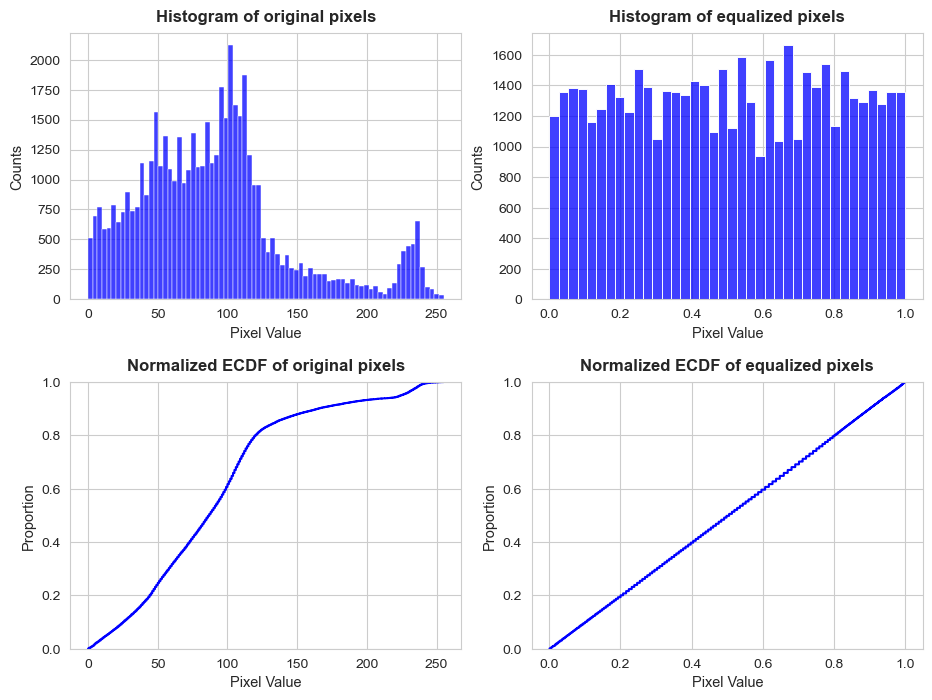

In [37]:
gray_img_pixels_vector = gray_img_pixels_matrix.flatten()
equalized_gray_img_pixels_vector = equalized_gray_img_pixels_matrix.flatten()

fig, axes = plt.subplots(2, 2, figsize=(11,8))
axes = axes.flatten() 

sns.histplot(x=gray_img_pixels_vector, stat='count', color='blue', ax=axes[0])
sns.ecdfplot(x=gray_img_pixels_vector, stat='proportion', color='blue', ax=axes[2])

sns.histplot(x=equalized_gray_img_pixels_vector, stat='count', color='blue', ax=axes[1])
sns.ecdfplot(x=equalized_gray_img_pixels_vector, stat='proportion', color='blue', ax=axes[3])

axes[0].set_title('Histogram of original pixels', size=12, weight='bold', y=1.01)
axes[2].set_title('Normalized ECDF of original pixels', size=12, weight='bold', y=1.01)
axes[1].set_title('Histogram of equalized pixels', size=12, weight='bold', y=1.01)
axes[3].set_title('Normalized ECDF of equalized pixels', size=12, weight='bold', y=1.01)

for i in range(len(axes)):
    axes[i].set_xlabel('Pixel Value', size=10.5)
    axes[i].tick_params(axis='x', labelsize=10)
    axes[i].tick_params(axis='y', labelsize=10)
    if i in [0,1]:
        axes[i].set_ylabel('Counts', size=10.5)
    elif i in [2,3]:
        axes[i].set_ylabel('Proportion', size=10.5)

plt.subplots_adjust(hspace=0.31, wspace=0.18) 
plt.show()

The effect of equalization in the both the histogram and CDF of pixels is pretty evident.

The next step will be to plot the original images together with the equalized one, to extract more insight about the effects of equalization.

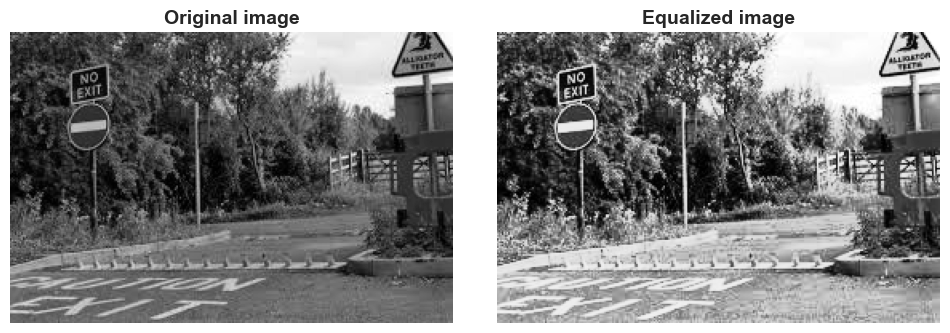

In [38]:
fig, axes = plt.subplots(1, 2, figsize=(12,8))
axes = axes.flatten() 

axes[0].imshow(gray_img_pixels_matrix, cmap='gray')
axes[1].imshow(equalized_gray_img_pixels_matrix, cmap='gray')

axes[0].set_title('Original image', size=14, weight='bold')
axes[1].set_title('Equalized image', size=14, weight='bold')

for i in range(len(axes)):
    axes[i].axis('off')  # Hide the axis

plt.subplots_adjust(hspace=0.2, wspace=0.1) 
plt.show()

Differences in terms of bright and contrast are pretty clear.

We can equalize an image just just in one line using the method `equalize_hist` of the `exposure` class contained in `skimage` package:

In [39]:
equalized_gray_img_pixels_vector = exposure.equalize_hist(gray_img_pixels_matrix)
equalized_gray_img_pixels_vector

array([[0.23180069, 0.50567303, 0.74150038, ..., 0.99934542, 0.99966279,
        0.99966279],
       [0.13795771, 0.39052644, 0.26901258, ..., 0.99966279, 0.99966279,
        0.99966279],
       [0.56016186, 0.67030983, 0.86239933, ..., 0.99934542, 0.99966279,
        0.99986115],
       ...,
       [0.69143492, 0.63740231, 0.59642163, ..., 0.71226247, 0.70192804,
        0.68108065],
       [0.63740231, 0.68108065, 0.71226247, ..., 0.79644543, 0.74150038,
        0.71226247],
       [0.70192804, 0.69143492, 0.67030983, ..., 0.85176737, 0.8120165 ,
        0.78295712]])

### **Equalization of color-scale images directly**

In this section we are going to see how to equalize color images directly. Later another procedure based on HSV color space will be shown.

In [40]:
color_img_pixels_matrix = np.array(example_img)
directly_equalized_color_img_pixels_matrix, pixels_cdf_norm = get_equalization(img_array=color_img_pixels_matrix)

In [41]:
directly_equalized_color_img_pixels_matrix

array([[[0.16106637, 0.45940942, 0.05620132],
        [0.38729982, 0.72478544, 0.29028973],
        [0.51822906, 0.84575052, 0.41615424],
        ...,
        [0.99933881, 0.99847265, 1.        ],
        [0.99951072, 0.99886275, 1.        ],
        [0.99951072, 0.99847265, 1.        ]],

       [[0.05620132, 0.38247973, 0.05620132],
        [0.29554621, 0.59666627, 0.2098425 ],
        [0.2098425 , 0.47423996, 0.0987358 ],
        ...,
        [0.99918012, 0.99886275, 1.        ],
        [0.99918012, 0.99886275, 1.        ],
        [0.99933881, 0.99886275, 1.        ]],

       [[0.39686727, 0.79072612, 0.33831211],
        [0.45940942, 0.83064228, 0.39217281],
        [0.7333611 , 0.89567713, 0.58224567],
        ...,
        [0.99886275, 0.99886275, 0.99886275],
        [0.99918012, 0.99886275, 1.        ],
        [0.99933881, 0.99918012, 1.        ]],

       ...,

       [[0.57520398, 0.7333611 , 0.76511154],
        [0.54227   , 0.69056876, 0.72478544],
        [0.51822906, 0

In [42]:
color_img_pixels_matrix

array([[[ 17,  73,   0],
        [ 58, 111,  39],
        [ 84, 136,  64],
        ...,
        [253, 250, 255],
        [254, 251, 255],
        [254, 250, 255]],

       [[  0,  57,   0],
        [ 40,  96,  25],
        [ 25,  76,   7],
        ...,
        [252, 251, 255],
        [252, 251, 255],
        [253, 251, 255]],

       [[ 60, 120,  48],
        [ 73, 130,  59],
        [112, 163,  94],
        ...,
        [251, 251, 251],
        [252, 251, 255],
        [253, 252, 255]],

       ...,

       [[ 93, 112, 116],
        [ 88, 107, 111],
        [ 84, 103, 107],
        ...,
        [101, 112, 116],
        [100, 111, 115],
        [ 98, 109, 113]],

       [[ 88, 107, 111],
        [ 92, 111, 115],
        [ 95, 114, 118],
        ...,
        [111, 122, 126],
        [104, 115, 119],
        [101, 112, 116]],

       [[ 94, 113, 117],
        [ 93, 112, 116],
        [ 91, 110, 114],
        ...,
        [127, 138, 142],
        [114, 125, 129],
        [109, 120, 124]]

In [43]:
color_img_pixels_matrix.shape

(182, 277, 3)

In [44]:
directly_equalized_color_img_pixels_matrix.shape

(182, 277, 3)

As before, we plot both images to see the effect of equalization, but now in color images.

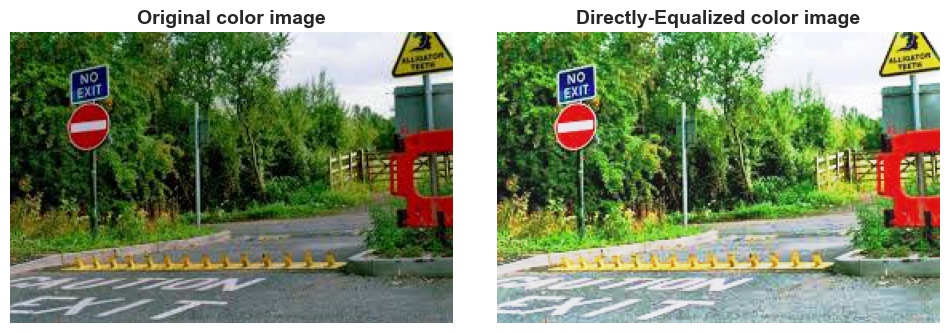

In [45]:
fig, axes = plt.subplots(1, 2, figsize=(12,7))
axes = axes.flatten() 

axes[0].imshow(color_img_pixels_matrix, cmap='gray')
axes[1].imshow(directly_equalized_color_img_pixels_matrix, cmap='gray')

axes[0].set_title('Original color image', size=14, weight='bold')
axes[1].set_title('Directly-Equalized color image', size=14, weight='bold')

for i in range(len(axes)):
    axes[i].axis('off')  # Hide the axis

plt.subplots_adjust(hspace=0.2, wspace=0.1) 
plt.show()

Again, the effect is crystal clear, specially in terms of bright and contrast.

As was mentioned before, same result can be achieved using `skimage`.

In [46]:
directly_equalized_color_img_pixels_matrix = exposure.equalize_hist(color_img_pixels_matrix)
directly_equalized_color_img_pixels_matrix

c:\Users\fscielzo\anaconda3\Lib\site-packages\skimage\_shared\utils.py:326: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


array([[[0.16106637, 0.45940942, 0.05620132],
        [0.38729982, 0.72478544, 0.29028973],
        [0.51822906, 0.84575052, 0.41615424],
        ...,
        [0.99933881, 0.99847265, 1.        ],
        [0.99951072, 0.99886275, 1.        ],
        [0.99951072, 0.99847265, 1.        ]],

       [[0.05620132, 0.38247973, 0.05620132],
        [0.29554621, 0.59666627, 0.2098425 ],
        [0.2098425 , 0.47423996, 0.0987358 ],
        ...,
        [0.99918012, 0.99886275, 1.        ],
        [0.99918012, 0.99886275, 1.        ],
        [0.99933881, 0.99886275, 1.        ]],

       [[0.39686727, 0.79072612, 0.33831211],
        [0.45940942, 0.83064228, 0.39217281],
        [0.7333611 , 0.89567713, 0.58224567],
        ...,
        [0.99886275, 0.99886275, 0.99886275],
        [0.99918012, 0.99886275, 1.        ],
        [0.99933881, 0.99918012, 1.        ]],

       ...,

       [[0.57520398, 0.7333611 , 0.76511154],
        [0.54227   , 0.69056876, 0.72478544],
        [0.51822906, 0

### **Equalization of color-scale images with HSV**

HSV stands for Hue, Saturation, and Value (or Brightness), and it's a color space commonly used in image processing and computer vision. It represents colors in a cylindrical coordinate system, making it particularly intuitive for tasks such as color selection, image segmentation, and color-based feature extraction.

Here's a brief explanation of each component of the HSV color space:

- **Hue (H)**: This represents the type of color, such as red, green, blue, etc. It's often measured in degrees ranging from 0 to 360, where 0 and 360 both correspond to red, 120 to green, and 240 to blue. The hue value essentially describes the dominant wavelength of light that gives the color its perceived hue.

- **Saturation (S)**: This component represents the intensity or purity of the color. It quantifies how much white light is mixed with the hue. A saturation value of 0 indicates a completely unsaturated (gray) color, while a value of 1 represents the most vivid version of that color.

- **Value (V)** (Brightness): This represents the brightness or intensity of the color. It indicates how much light is emitted by the color. A value of 0 represents black (no light), while a value of 1 represents the brightest possible version of the color.

By representing colors in terms of hue, saturation, and value, rather than the RGB (Red, Green, Blue) color space, HSV separates the information about color type, intensity, and brightness. This makes it easier to manipulate and interpret colors for various image processing tasks, such as adjusting color balance, detecting objects based on color, or segmenting regions of interest in an image based on their color characteristics.

The custom function `get_V_component` returns the HSV pixels array for a given RGB pixels arrays, as well as the V component of that array, that is, its third column. This component has an important role, since will allow as to equalize and filter color images in a suitable way.

In [47]:
V_component, img_array_HSV = get_V_component(color_img_pixels_matrix)

In [48]:
img_array_HSV

array([[[0.29452055, 1.        , 0.28627451],
        [0.28935185, 0.64864865, 0.43529412],
        [0.28703704, 0.52941176, 0.53333333],
        ...,
        [0.76666667, 0.01960784, 1.        ],
        [0.79166667, 0.01568627, 1.        ],
        [0.8       , 0.01960784, 1.        ]],

       [[0.33333333, 1.        , 0.22352941],
        [0.29812207, 0.73958333, 0.37647059],
        [0.28985507, 0.90789474, 0.29803922],
        ...,
        [0.70833333, 0.01568627, 1.        ],
        [0.70833333, 0.01568627, 1.        ],
        [0.75      , 0.01568627, 1.        ]],

       [[0.30555556, 0.6       , 0.47058824],
        [0.30046948, 0.54615385, 0.50980392],
        [0.28985507, 0.42331288, 0.63921569],
        ...,
        [0.        , 0.        , 0.98431373],
        [0.70833333, 0.01568627, 1.        ],
        [0.72222222, 0.01176471, 1.        ]],

       ...,

       [[0.52898551, 0.19827586, 0.45490196],
        [0.52898551, 0.20720721, 0.43529412],
        [0.52898551, 0

In [49]:
color_img_pixels_matrix # RBG array

array([[[ 17,  73,   0],
        [ 58, 111,  39],
        [ 84, 136,  64],
        ...,
        [253, 250, 255],
        [254, 251, 255],
        [254, 250, 255]],

       [[  0,  57,   0],
        [ 40,  96,  25],
        [ 25,  76,   7],
        ...,
        [252, 251, 255],
        [252, 251, 255],
        [253, 251, 255]],

       [[ 60, 120,  48],
        [ 73, 130,  59],
        [112, 163,  94],
        ...,
        [251, 251, 251],
        [252, 251, 255],
        [253, 252, 255]],

       ...,

       [[ 93, 112, 116],
        [ 88, 107, 111],
        [ 84, 103, 107],
        ...,
        [101, 112, 116],
        [100, 111, 115],
        [ 98, 109, 113]],

       [[ 88, 107, 111],
        [ 92, 111, 115],
        [ 95, 114, 118],
        ...,
        [111, 122, 126],
        [104, 115, 119],
        [101, 112, 116]],

       [[ 94, 113, 117],
        [ 93, 112, 116],
        [ 91, 110, 114],
        ...,
        [127, 138, 142],
        [114, 125, 129],
        [109, 120, 124]]

- H component:  a matrix with the first column of the 2D array `img_array_HSV[i]` as i-th row.

In [50]:
img_array_HSV[:,:,0]

array([[0.29452055, 0.28935185, 0.28703704, ..., 0.76666667, 0.79166667,
        0.8       ],
       [0.33333333, 0.29812207, 0.28985507, ..., 0.70833333, 0.70833333,
        0.75      ],
       [0.30555556, 0.30046948, 0.28985507, ..., 0.        , 0.70833333,
        0.72222222],
       ...,
       [0.52898551, 0.52898551, 0.52898551, ..., 0.54444444, 0.54444444,
        0.54444444],
       [0.52898551, 0.52898551, 0.52898551, ..., 0.54444444, 0.54444444,
        0.54444444],
       [0.52898551, 0.52898551, 0.52898551, ..., 0.54444444, 0.54444444,
        0.54444444]])

- S component:  a matrix with the second column of the 2D array `img_array_HSV[i]` as i-th row.

In [51]:
img_array_HSV[:,:,1]

array([[1.        , 0.64864865, 0.52941176, ..., 0.01960784, 0.01568627,
        0.01960784],
       [1.        , 0.73958333, 0.90789474, ..., 0.01568627, 0.01568627,
        0.01568627],
       [0.6       , 0.54615385, 0.42331288, ..., 0.        , 0.01568627,
        0.01176471],
       ...,
       [0.19827586, 0.20720721, 0.21495327, ..., 0.12931034, 0.13043478,
        0.13274336],
       [0.20720721, 0.2       , 0.19491525, ..., 0.11904762, 0.12605042,
        0.12931034],
       [0.1965812 , 0.19827586, 0.20175439, ..., 0.1056338 , 0.11627907,
        0.12096774]])

- V component: a matrix with the third column of the 2D array `img_array_HSV[i]` as i-th row.

In [52]:
img_array_HSV[:,:,2]

array([[0.28627451, 0.43529412, 0.53333333, ..., 1.        , 1.        ,
        1.        ],
       [0.22352941, 0.37647059, 0.29803922, ..., 1.        , 1.        ,
        1.        ],
       [0.47058824, 0.50980392, 0.63921569, ..., 0.98431373, 1.        ,
        1.        ],
       ...,
       [0.45490196, 0.43529412, 0.41960784, ..., 0.45490196, 0.45098039,
        0.44313725],
       [0.43529412, 0.45098039, 0.4627451 , ..., 0.49411765, 0.46666667,
        0.45490196],
       [0.45882353, 0.45490196, 0.44705882, ..., 0.55686275, 0.50588235,
        0.48627451]])

In [53]:
V_component

array([[0.28627451, 0.43529412, 0.53333333, ..., 1.        , 1.        ,
        1.        ],
       [0.22352941, 0.37647059, 0.29803922, ..., 1.        , 1.        ,
        1.        ],
       [0.47058824, 0.50980392, 0.63921569, ..., 0.98431373, 1.        ,
        1.        ],
       ...,
       [0.45490196, 0.43529412, 0.41960784, ..., 0.45490196, 0.45098039,
        0.44313725],
       [0.43529412, 0.45098039, 0.4627451 , ..., 0.49411765, 0.46666667,
        0.45490196],
       [0.45882353, 0.45490196, 0.44705882, ..., 0.55686275, 0.50588235,
        0.48627451]])

In [54]:
V_component.shape

(182, 277)

The custom function `equalize_color_image_HSV` perform the operation of equalizing a color image based on HSV color space.

The basic pipeline is the following:

Color image $\hspace{0.1cm}\Rightarrow\hspace{0.1cm}$ RGB pixels array $\hspace{0.1cm}\Rightarrow\hspace{0.1cm}$ HSV pixels array $\hspace{0.1cm}\Rightarrow\hspace{0.1cm}$ Equalize V component (is a gray image) $\hspace{0.1cm}\Rightarrow\hspace{0.1cm}$ Update HSV pixels array with the equalized V component $\hspace{0.1cm}\Rightarrow\hspace{0.1cm}$ Convert HSV to RGB $\hspace{0.1cm}\Rightarrow\hspace{0.1cm}$ Equalized RGB pixels matrix.

Above pipeline is visualized in the following plot.

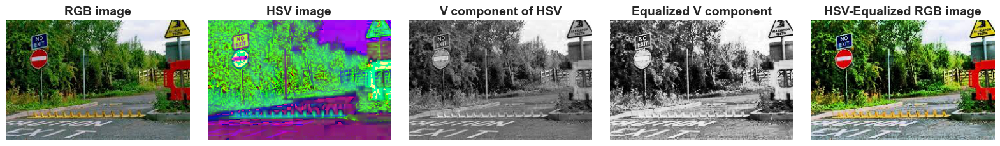

In [55]:

V_component_equalized = exposure.equalize_hist(V_component)
HSV_equalized_color_img_pixels_matrix = equalize_color_image_HSV(color_img_pixels_matrix)

fig, axes = plt.subplots(1, 5, figsize=(20,6))
axes = axes.flatten() 

axes[0].imshow(color_img_pixels_matrix, cmap='gray')
axes[1].imshow(img_array_HSV, cmap='gray')
axes[2].imshow(V_component, cmap='gray')
axes[3].imshow(V_component_equalized, cmap='gray')
axes[4].imshow(HSV_equalized_color_img_pixels_matrix, cmap='gray')

axes[0].set_title('RGB image', size=14, weight='bold')
axes[1].set_title('HSV image', size=14, weight='bold')
axes[2].set_title('V component of HSV', size=14, weight='bold')
axes[3].set_title('Equalized V component', size=14, weight='bold')
axes[4].set_title('HSV-Equalized RGB image', size=14, weight='bold')

for i in range(len(axes)):
    axes[i].axis('off')  # Hide the axis

plt.subplots_adjust(hspace=0.2, wspace=0.1) 
plt.show()

#### **Comparison of equalization approaches**

The following plot is meaningful in order to visualize differences between equalizing a color image directly and with HSV method.

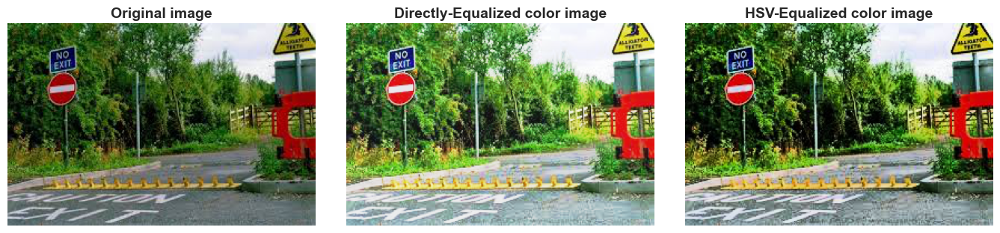

In [56]:
fig, axes = plt.subplots(1, 3, figsize=(17,7))
axes = axes.flatten() 

axes[0].imshow(color_img_pixels_matrix, cmap='gray')
axes[1].imshow(directly_equalized_color_img_pixels_matrix, cmap='gray')
axes[2].imshow(HSV_equalized_color_img_pixels_matrix, cmap='gray')

axes[0].set_title('Original image', size=14, weight='bold')
axes[1].set_title('Directly-Equalized color image', size=14, weight='bold')
axes[2].set_title('HSV-Equalized color image', size=14, weight='bold')

for i in range(len(axes)):
    axes[i].axis('off')  # Hide the axis
    
plt.subplots_adjust(hspace=0.2, wspace=0.1)     
plt.show()

## **Other Filters**

In this section other filters beyond equalization will be presented, but not as deeply.

The filters that will be presented in a practical manner are the following:

- Sobel
- Canny
- Convolve1
- Gaussian
- Hessian
- Noisy
- Butterworth
- Correlate1
- Prewitt
- Bilateral
- Erosion
- Dilation


By practical manner we referred that we are not going to explain the theory behind these filters, let say, how these filters actually work, but only the visual effect of applying them will be shown.

These filter can be applied both in color and gray images.

### **Filtering gray-scale images**

In [57]:
gray_img_pixels_matrix = np.array(example_img.convert('L'))

mask_1 = np.ones((3, 3)) * 1/9 
mask_2 = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
mask_3 = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])

filtered_img_pixels_matrix = {}
filtered_img_pixels_matrix['sobel'] = apply_filter(img_array=gray_img_pixels_matrix, filter='sobel', gray_img=True)
filtered_img_pixels_matrix['canny'] = apply_filter(img_array=gray_img_pixels_matrix, filter='canny', gray_img=True)
filtered_img_pixels_matrix['convolve1'] = apply_filter(img_array=gray_img_pixels_matrix, filter='convolve', weights=mask_1, gray_img=True)
filtered_img_pixels_matrix['convolve2'] = apply_filter(img_array=gray_img_pixels_matrix, filter='convolve', weights=mask_2, gray_img=True)
filtered_img_pixels_matrix['convolve3'] = apply_filter(img_array=gray_img_pixels_matrix, filter='convolve', weights=mask_3, gray_img=True)
filtered_img_pixels_matrix['gaussian'] = apply_filter(img_array=gray_img_pixels_matrix, filter='gaussian', sigma=2, gray_img=True)
filtered_img_pixels_matrix['hessian'] = apply_filter(img_array=gray_img_pixels_matrix, filter='hessian', gray_img=True)
filtered_img_pixels_matrix['noisy'] = apply_filter(img_array=gray_img_pixels_matrix, filter='noisy', gray_img=True)
filtered_img_pixels_matrix['butterworth'] = apply_filter(img_array=gray_img_pixels_matrix, filter='butterworth', sigma=2, gray_img=True)
filtered_img_pixels_matrix['correlate1'] = apply_filter(img_array=gray_img_pixels_matrix, filter='correlate', weights=mask_1, gray_img=True)
filtered_img_pixels_matrix['correlate2'] = apply_filter(img_array=gray_img_pixels_matrix, filter='correlate', weights=mask_2, gray_img=True)
filtered_img_pixels_matrix['correlate3'] = apply_filter(img_array=gray_img_pixels_matrix, filter='correlate', weights=mask_3, gray_img=True)
filtered_img_pixels_matrix['prewitt'] = apply_filter(img_array=gray_img_pixels_matrix, filter='prewitt', gray_img=True)
filtered_img_pixels_matrix['bilateral'] = apply_filter(img_array=gray_img_pixels_matrix, filter='bilateral', gray_img=True)
filtered_img_pixels_matrix['erosion'] = apply_filter(img_array=gray_img_pixels_matrix, filter='erosion', gray_img=True)
filtered_img_pixels_matrix['dilation'] = apply_filter(img_array=gray_img_pixels_matrix, filter='dilation', gray_img=True)
filtered_img_pixels_matrix['equalized'] = apply_filter(img_array=gray_img_pixels_matrix, filter='equalized', gray_img=True)

C:\Users\fscielzo\Documents\Packages\PyImageML_Package_Private\PyImageML\preprocessing.py:134: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  img_array = filter_gray_image(img_array=img_array, filter=filter, weights=weights, sigma=sigma)


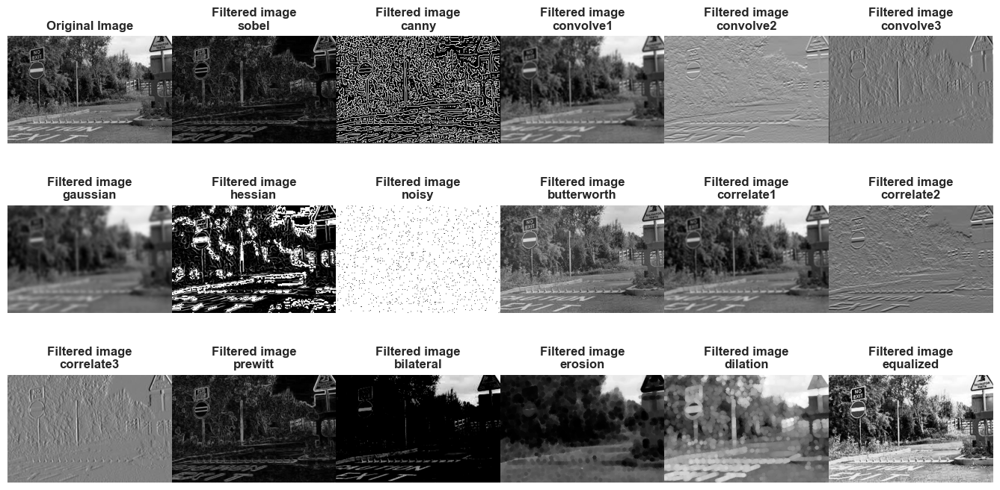

In [58]:
images_to_plot = {'Original Image': gray_img_pixels_matrix}
images_to_plot.update({f'Filtered image\n{filter}': filtered_img_pixels_matrix[filter] for filter in filtered_img_pixels_matrix.keys()})
n_subplots = len(images_to_plot.items())
n_rows = 3
n_cols = 6
fig, axes = plt.subplots(n_rows, n_cols, figsize=(17,8))
axes = axes.flatten() 

for i, (title, img) in enumerate(images_to_plot.items()):

    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(title, size=12, weight='bold')
    axes[i].axis('off')  # Hide the axis   

plt.subplots_adjust(hspace=0.4, wspace=0) 
for j in range(n_subplots, n_rows * n_cols):
    fig.delaxes(axes[j])
plt.show()

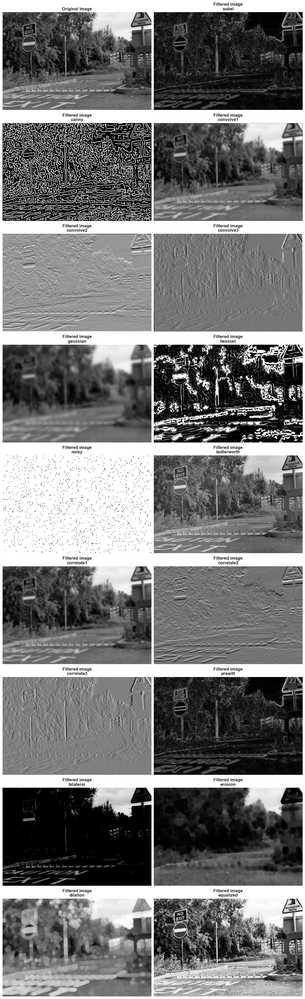

In [59]:
n_subplots = len(images_to_plot.items())
n_rows = n_subplots
n_cols = 2
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15,100))
axes = axes.flatten() 

for i, (title, img) in enumerate(images_to_plot.items()):

    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(title, size=12, weight='bold')
    axes[i].axis('off')  # Hide the axis   

plt.subplots_adjust(hspace=0.075, wspace=0.015) 
for j in range(n_subplots, n_rows * n_cols):
    fig.delaxes(axes[j])
plt.show()

### **Filtering color images**

In [60]:
color_img_pixels_matrix = np.array(example_img)

mask_1 = np.ones((3, 3)) * 1/9 
mask_2 = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
mask_3 = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])

filtered_img_pixels_matrix = {}
filtered_img_pixels_matrix['sobel'] = apply_filter(img_array=color_img_pixels_matrix, filter='sobel', gray_img=False)
filtered_img_pixels_matrix['canny'] = apply_filter(img_array=color_img_pixels_matrix, filter='canny', gray_img=False)
filtered_img_pixels_matrix['convolve1'] = apply_filter(img_array=color_img_pixels_matrix, filter='convolve', weights=mask_1, gray_img=False)
filtered_img_pixels_matrix['convolve2'] = apply_filter(img_array=color_img_pixels_matrix, filter='convolve', weights=mask_2, gray_img=False)
filtered_img_pixels_matrix['convolve3'] = apply_filter(img_array=color_img_pixels_matrix, filter='convolve', weights=mask_3, gray_img=False)
filtered_img_pixels_matrix['gaussian'] = apply_filter(img_array=color_img_pixels_matrix, filter='gaussian', sigma=2, gray_img=False)
filtered_img_pixels_matrix['hessian'] = apply_filter(img_array=color_img_pixels_matrix, filter='hessian', gray_img=False)
filtered_img_pixels_matrix['noisy'] = apply_filter(img_array=color_img_pixels_matrix, filter='noisy', gray_img=False)
filtered_img_pixels_matrix['butterworth'] = apply_filter(img_array=color_img_pixels_matrix, filter='butterworth', sigma=2, gray_img=False)
filtered_img_pixels_matrix['correlate1'] = apply_filter(img_array=color_img_pixels_matrix, filter='correlate', weights=mask_1, gray_img=False)
filtered_img_pixels_matrix['correlate2'] = apply_filter(img_array=color_img_pixels_matrix, filter='correlate', weights=mask_2, gray_img=False)
filtered_img_pixels_matrix['correlate3'] = apply_filter(img_array=color_img_pixels_matrix, filter='correlate', weights=mask_3, gray_img=False)
filtered_img_pixels_matrix['prewitt'] = apply_filter(img_array=color_img_pixels_matrix, filter='prewitt', gray_img=False)
filtered_img_pixels_matrix['bilateral'] = apply_filter(img_array=color_img_pixels_matrix, filter='bilateral', gray_img=False)
filtered_img_pixels_matrix['erosion'] = apply_filter(img_array=color_img_pixels_matrix, filter='erosion', gray_img=False)
filtered_img_pixels_matrix['dilation'] = apply_filter(img_array=color_img_pixels_matrix, filter='dilation', gray_img=False)
filtered_img_pixels_matrix['equalized'] = apply_filter(img_array=color_img_pixels_matrix, filter='equalized', gray_img=False)

C:\Users\fscielzo\Documents\Packages\PyImageML_Package_Private\PyImageML\preprocessing.py:141: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  img_array = filter_color_image(img_array=img_array, filter=filter, weights=weights, sigma=sigma)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


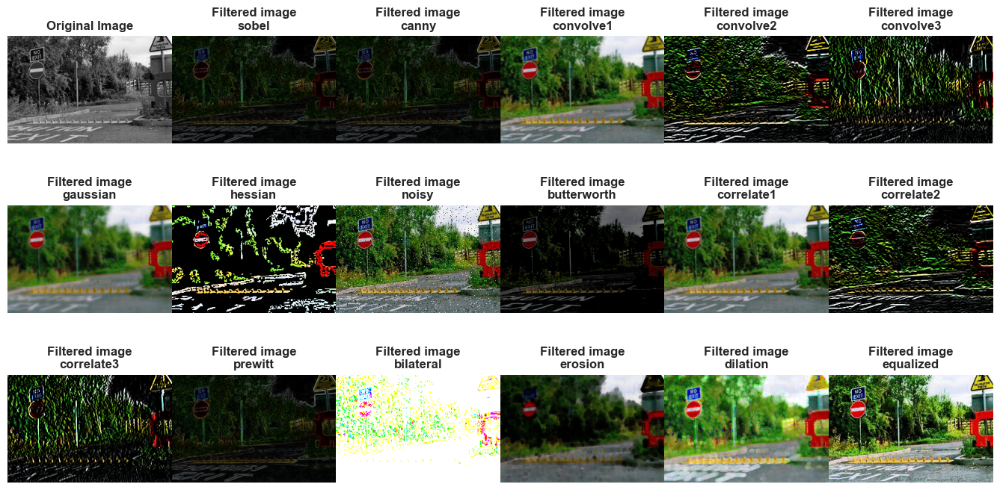

In [61]:
images_to_plot = {'Original Image': gray_img_pixels_matrix}
images_to_plot.update({f'Filtered image\n{filter}': filtered_img_pixels_matrix[filter] for filter in filtered_img_pixels_matrix.keys()})
n_subplots = len(images_to_plot.items())
n_rows = 3
n_cols = 6
fig, axes = plt.subplots(n_rows, n_cols, figsize=(17,8))
axes = axes.flatten() 

for i, (title, img) in enumerate(images_to_plot.items()):

    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(title, size=12, weight='bold')
    axes[i].axis('off')  # Hide the axis   

plt.subplots_adjust(hspace=0.4, wspace=0) 
for j in range(n_subplots, n_rows * n_cols):
    fig.delaxes(axes[j])
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


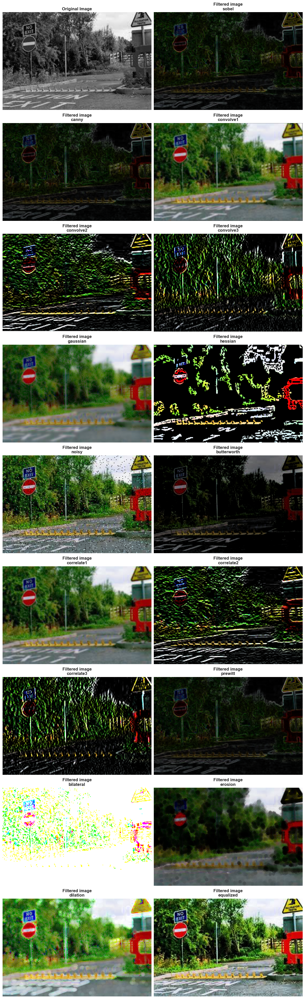

In [62]:
n_subplots = len(images_to_plot.items())
n_rows = n_subplots
n_cols = 2
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15,100))
axes = axes.flatten() 

for i, (title, img) in enumerate(images_to_plot.items()):

    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(title, size=12, weight='bold')
    axes[i].axis('off')  # Hide the axis   

plt.subplots_adjust(hspace=0.075, wspace=0.015) 
for j in range(n_subplots, n_rows * n_cols):
    fig.delaxes(axes[j])
plt.show()